In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
unconfined=True

In [36]:
from rdkit import Chem
from rdkit.Chem import AllChem
import matplotlib.pyplot as plt
from matplotlib import rc
rc('font', **{'family':'serif','serif':['Times']})
rc('text', usetex=True)
import pandas as pd
import sys
import os
import copy
import tqdm
import itertools
import numpy as np
from itertools import product
from _utils import assign_hydrogen_pdbinfo, map_mol_with_noe

# distance calc

In [3]:
!ls ../../../../Conformers/

CsA_baseline_numconf5400.pdb  CsA_chcl3_noebounds_numconf5400.pdb  Shuzhe


In [41]:
mol = Chem.MolFromPDBFile("../../../../Conformers/CsA_chcl3_noebounds_numconf5400.pdb", removeHs = False)

df = pd.read_csv("../CsA/CsA_chcl3_noebounds.csv", sep = "\s", comment = "#")

mol_atom_names2atom_index, noe_atom_names2mol_atom_names, noe_atom_pair2upper_distance = map_mol_with_noe(mol, df, verbose = False)

index_1, index_2 = [], [] #symmetric, thus two lists are interchangable
labels = []
ref_val = []
for key, val in noe_atom_pair2upper_distance.items():
    tmp_1 = noe_atom_names2mol_atom_names[key[0]]
    tmp_2 = noe_atom_names2mol_atom_names[key[1]]
    a = mol_atom_names2atom_index[tmp_1]
    print(tmp_1, a, tmp_2)
    b = mol_atom_names2atom_index[tmp_2]
    for item in product(a,b):
        index_1.append(item[0])
        index_2.append(item[1])
        ref_val.append(val)
        labels.append("{}:{}{}-{}:{}{} ({:0.2f})".format(item[0], tmp_1[0], tmp_1[1], item[1], tmp_2[0], tmp_2[1], val))

distance_matrix_for_each_conformer = np.array([Chem.Get3DDistanceMatrix(mol, i) for i in tqdm.tqdm(range(mol.GetNumConformers()))])

with_noe = distance_matrix_for_each_conformer[:, index_1, index_2]

bl_mol = Chem.MolFromPDBFile("../../../../Conformers/CsA_baseline_numconf5400.pdb", removeHs = False)
distance_matrix_for_each_conformer = np.array([Chem.Get3DDistanceMatrix(bl_mol, i) for i in tqdm.tqdm(range(mol.GetNumConformers()))])
baseline = distance_matrix_for_each_conformer[:, index_1, index_2]

/home/kkajo/miniconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  This is separate from the ipykernel package so we can avoid doing imports until
  6%|▌         | 304/5400 [00:00<00:01, 3032.25it/s]

('1', 'HCA') [88] ('6', 'HCA')
('6', 'HCA') [139] ('1', 'HCA')
('1', 'HCA') [88] ('7', 'HN')
('7', 'HN') [149] ('1', 'HCA')
('7', 'HN') [149] ('11', 'HCN')
('11', 'HCN') [185, 186, 187] ('7', 'HN')
('8', 'HN') [154] ('11', 'HCN')
('11', 'HCN') [185, 186, 187] ('8', 'HN')
('6', 'HCA') [139] ('11', 'HCN')
('11', 'HCN') [185, 186, 187] ('6', 'HCA')
('8', 'HCA') [155] ('11', 'HCN')
('11', 'HCN') [185, 186, 187] ('8', 'HCA')
('2', 'HN') [102] ('5', 'HN')
('5', 'HN') [127] ('2', 'HN')
('1', 'HCA') [88] ('6', 'HCD1')
('6', 'HCD1') [143, 144, 145] ('1', 'HCA')
('1', 'HCA') [88] ('7', 'HCB')
('7', 'HCB') [151, 152, 153] ('1', 'HCA')
('1', 'HCD1') [92, 93, 94] ('6', 'HCA')
('6', 'HCA') [139] ('1', 'HCD1')
('2', 'HN') [102] ('5', 'HCB')
('5', 'HCB') [129] ('2', 'HN')
('1', 'HCD1') [92, 93, 94] ('6', 'HCD1')
('6', 'HCD1') [143, 144, 145] ('1', 'HCD1')
('2', 'HCB') [104, 105] ('5', 'HCB')
('5', 'HCB') [129] ('2', 'HCB')
('3', 'HCA') [112, 113] ('5', 'HN')
('5', 'HN') [127] ('3', 'HCA')
('1', 'HOG1'

100%|██████████| 5400/5400 [00:02<00:00, 2130.47it/s]


In [42]:
noe_atom_pair2upper_distance

{(('1', 'HA'), ('6', 'HA')): 4.1499999999999995,
 (('6', 'HA'), ('1', 'HA')): 4.1499999999999995,
 (('1', 'HA'), ('7', 'HN')): 4.62,
 (('7', 'HN'), ('1', 'HA')): 4.62,
 (('7', 'HN'), ('11', 'HCN')): 4.16,
 (('11', 'HCN'), ('7', 'HN')): 4.16,
 (('8', 'HN'), ('11', 'HCN')): 4.35,
 (('11', 'HCN'), ('8', 'HN')): 4.35,
 (('6', 'HA'), ('11', 'HCN')): 3.9299999999999997,
 (('11', 'HCN'), ('6', 'HA')): 3.9299999999999997,
 (('8', 'HA'), ('11', 'HCN')): 4.61,
 (('11', 'HCN'), ('8', 'HA')): 4.61,
 (('2', 'HN'), ('5', 'HN')): 4.65,
 (('5', 'HN'), ('2', 'HN')): 4.65,
 (('1', 'HA'), ('6', 'HD1')): 4.63,
 (('6', 'HD1'), ('1', 'HA')): 4.63,
 (('1', 'HA'), ('7', 'HB')): 5.5,
 (('7', 'HB'), ('1', 'HA')): 5.5,
 (('1', 'HD1'), ('6', 'HA')): 4.13,
 (('6', 'HA'), ('1', 'HD1')): 4.13,
 (('2', 'HN'), ('5', 'HB')): 4.79,
 (('5', 'HB'), ('2', 'HN')): 4.79,
 (('1', 'HD1'), ('6', 'HD1')): 4.99,
 (('6', 'HD1'), ('1', 'HD1')): 4.99,
 (('2', 'HB'), ('5', 'HB')): 4.16,
 (('5', 'HB'), ('2', 'HB')): 4.16,
 (('3', 'HA'

In [40]:
labels

['88:1HCA-139:6HCA (4.15)',
 '139:6HCA-88:1HCA (4.15)',
 '88:1HCA-149:7HN (4.62)',
 '149:7HN-88:1HCA (4.62)',
 '149:7HN-185:11HCN (4.16)',
 '149:7HN-186:11HCN (4.16)',
 '149:7HN-187:11HCN (4.16)',
 '185:11HCN-149:7HN (4.16)',
 '186:11HCN-149:7HN (4.16)',
 '187:11HCN-149:7HN (4.16)',
 '154:8HN-185:11HCN (4.35)',
 '154:8HN-186:11HCN (4.35)',
 '154:8HN-187:11HCN (4.35)',
 '185:11HCN-154:8HN (4.35)',
 '186:11HCN-154:8HN (4.35)',
 '187:11HCN-154:8HN (4.35)',
 '139:6HCA-185:11HCN (3.93)',
 '139:6HCA-186:11HCN (3.93)',
 '139:6HCA-187:11HCN (3.93)',
 '185:11HCN-139:6HCA (3.93)',
 '186:11HCN-139:6HCA (3.93)',
 '187:11HCN-139:6HCA (3.93)',
 '155:8HCA-185:11HCN (4.61)',
 '155:8HCA-186:11HCN (4.61)',
 '155:8HCA-187:11HCN (4.61)',
 '185:11HCN-155:8HCA (4.61)',
 '186:11HCN-155:8HCA (4.61)',
 '187:11HCN-155:8HCA (4.61)',
 '102:2HN-127:5HN (4.65)',
 '127:5HN-102:2HN (4.65)',
 '88:1HCA-143:6HCD1 (4.63)',
 '88:1HCA-144:6HCD1 (4.63)',
 '88:1HCA-145:6HCD1 (4.63)',
 '143:6HCD1-88:1HCA (4.63)',
 '144:6HCD1-

In [6]:
ref_val

[4.1499999999999995,
 4.1499999999999995,
 4.62,
 4.62,
 4.16,
 4.16,
 4.16,
 4.16,
 4.16,
 4.16,
 4.35,
 4.35,
 4.35,
 4.35,
 4.35,
 4.35,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 4.61,
 4.61,
 4.61,
 4.61,
 4.61,
 4.61,
 4.65,
 4.65,
 4.63,
 4.63,
 4.63,
 4.63,
 4.63,
 4.63,
 5.5,
 5.5,
 5.5,
 5.5,
 5.5,
 5.5,
 4.13,
 4.13,
 4.13,
 4.13,
 4.13,
 4.13,
 4.79,
 4.79,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.16,
 4.16,
 4.16,
 4.16,
 4.379999999999999,
 4.379999999999999,
 4.379999999999999,
 4.379999999999999,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.19,
 5.19,
 5.19,
 5.19,
 4.83,
 4.83,
 4.83,
 4.83,
 4.83,
 4.83,
 4.49,
 4.49,
 5.23,
 5.23,
 5.23,
 5.23,
 5.23,
 5.23,
 3.8299999999999996,
 3.8299999999999996,
 3.8299999999999996,
 

In [7]:
product(a, b)

In [8]:
np.sum(with_noe <= 0)

0

In [9]:
plot_1 = with_noe

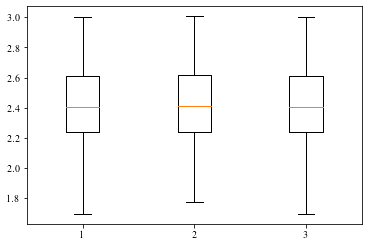

In [10]:
# bp_1 = plt.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])])

bp_1 = plt.boxplot([plot_1[:,i] for i in [-1,-2,-3]])

In [11]:
bp_1['whiskers'][-1].__dict__

{'_stale': False,
 'stale_callback': <function matplotlib.artist._stale_axes_callback(self, val)>,
 '_axes': <AxesSubplot:>,
 'figure': <Figure size 432x288 with 1 Axes>,
 '_transform': <matplotlib.transforms.CompositeGenericTransform at 0x7f0a16240da0>,
 '_transformSet': True,
 '_visible': True,
 '_animated': False,
 '_alpha': None,
 'clipbox': <matplotlib.transforms.TransformedBbox at 0x7f0a64b2bf28>,
 '_clippath': None,
 '_clipon': True,
 '_label': '_line16',
 '_picker': None,
 '_contains': None,
 '_rasterized': None,
 '_agg_filter': None,
 '_mouseover': False,
 'eventson': False,
 '_oid': 0,
 '_propobservers': {},
 '_remove_method': <function list.remove>,
 '_url': None,
 '_gid': None,
 '_snap': None,
 '_sketch': None,
 '_path_effects': [],
 '_sticky_edges': _XYPair(x=[], y=[]),
 '_in_layout': True,
 '_dashcapstyle': 'butt',
 '_dashjoinstyle': 'round',
 '_solidjoinstyle': 'round',
 '_solidcapstyle': 'projecting',
 '_linestyles': None,
 '_drawstyle': 'default',
 '_linewidth': 1.0,
 

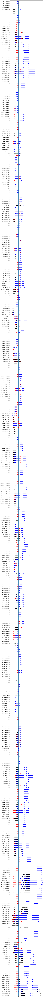

CPU times: user 19.5 s, sys: 760 ms, total: 20.3 s
Wall time: 20.8 s


In [27]:
plot_1 = copy.copy(with_noe) - ref_val
plot_2 = copy.copy(baseline) - ref_val

widths = 0.4
offset = 0.2
fig1, ax1 = plt.subplots(1, 1, figsize = (8,250))
def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)
# ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')

bp_1 = ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], vert = False, widths = widths, 
                   flierprops = red_square, positions = np.array(range(plot_1.shape[1])), manage_ticks=False)
bp_2 = ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], vert = False, widths = widths, 
                   flierprops = blue_square, positions = np.array(range(plot_2.shape[1])), manage_ticks=False)

set_box_color(bp_1, "red")
set_box_color(bp_2, "blue")
# with the offset it takes much longer to plot
#ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], positions = np.array(range(plot_1.shape[1])) + offset, vert = False, flierprops = red_square, widths = widths)
#ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], positions = np.array(range(plot_2.shape[1])) - offset, vert = False, flierprops = blue_square, widths = widths)

ax1.set_xlabel('Distance - Upper NOE Restraint / Å')
plt.grid(axis = "x", which = "both")
# plt.grid(axis = "y", which = "major")
# plt.axvline(x=2.20589566)
plt.yticks(range(plot_1.shape[1]), labels)
plt.ylim(0 - 0.5, plot_1.shape[1] - 0.5)
plt.xlim(-5, 15)
plt.axvline(x=0)

%time plt.show()

In [22]:
ref_val

[4.1499999999999995,
 4.1499999999999995,
 4.62,
 4.62,
 4.16,
 4.16,
 4.16,
 4.16,
 4.16,
 4.16,
 4.35,
 4.35,
 4.35,
 4.35,
 4.35,
 4.35,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 3.9299999999999997,
 4.61,
 4.61,
 4.61,
 4.61,
 4.61,
 4.61,
 4.65,
 4.65,
 4.63,
 4.63,
 4.63,
 4.63,
 4.63,
 4.63,
 5.5,
 5.5,
 5.5,
 5.5,
 5.5,
 5.5,
 4.13,
 4.13,
 4.13,
 4.13,
 4.13,
 4.13,
 4.79,
 4.79,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.99,
 4.16,
 4.16,
 4.16,
 4.16,
 4.379999999999999,
 4.379999999999999,
 4.379999999999999,
 4.379999999999999,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.140000000000001,
 5.19,
 5.19,
 5.19,
 5.19,
 4.83,
 4.83,
 4.83,
 4.83,
 4.83,
 4.83,
 4.49,
 4.49,
 5.23,
 5.23,
 5.23,
 5.23,
 5.23,
 5.23,
 3.8299999999999996,
 3.8299999999999996,
 3.8299999999999996,
 

In [39]:
len(ref_val)

512

In [29]:
#
np.argsort(np.sum((plot_1 - ref_val) < 0, 1))[-20:]

array([1811, 1810, 1809, 1808, 1807, 1806, 1805, 1804, 1855, 1803, 1801,
       1800, 1799, 1798, 1797, 1796, 1795, 1794, 1802, 5399])

In [35]:
(np.sum((plot_1 - ref_val) < 0, 0))[-60:]

array([5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400,
       5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400,
       5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400,
       5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400,
       5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400, 5400,
       5400, 5400, 5400, 5400, 5400])

In [46]:
#check if any conformer satisfy all restraints
tmp = with_noe - ref_val
tmp[tmp < 0] = 0
np.argsort(np.sum(tmp, 1))[:20], np.sum(tmp,1)[-20:]

(array([   0, 3604, 3603, 3602, 3601, 3600, 3599, 3598, 3597, 3596, 3595,
        3594, 3593, 3592, 3591, 3590, 3589, 3588, 3605, 3587]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.]))

5400
0


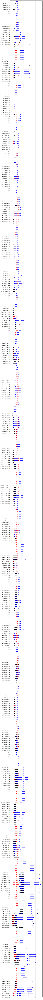

CPU times: user 42.7 s, sys: 1.1 s, total: 43.8 s
Wall time: 46.9 s


In [8]:
plot_1, plot_2 = with_noe, baseline

print(sum(np.all((plot_1 - ref_val) < 0, 1)))
print(sum(np.all((plot_2 - ref_val) < 0, 1)))


widths = 0.4
offsets = 0.2
fig1, ax1 = plt.subplots(1, 1, figsize = (8,250))
def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)
# ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')

bp_1 = ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], vert = False, widths = widths, flierprops = red_square)
bp_2 = ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], vert = False, widths = widths, flierprops = blue_square)

set_box_color(bp_1, "red")
set_box_color(bp_2, "blue")
## with the offset it takes much longer to plot
# ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], positions = np.array(range(plot_1.shape[1])) + offset, vert = False, flierprops = red_square, widths = width)
# ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], positions = np.array(range(plot_2.shape[1])) - offset, vert = False, flierprops = blue_square, widths = width)

ax1.set_xlabel('Distance (Å)')
plt.grid(axis = "x", which = "both")
# plt.grid(axis = "y", which = "major")
# plt.axvline(x=2.20589566)
plt.yticks(range(plot_1.shape[1]), labels)
%time plt.show()

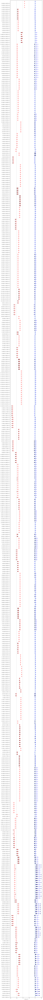

CPU times: user 15.7 s, sys: 205 ms, total: 15.9 s
Wall time: 16 s


In [126]:
plot_1, plot_2 = with_noe, baseline
plot_1 -= ref_val
plot_2 -= ref_val

widths = 0.4
offsets = 0.2
fig1, ax1 = plt.subplots(1, 1, figsize = (8,250))
def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)
# ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')

bp_1 = ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], vert = False, widths = widths, flierprops = red_square)
bp_2 = ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], vert = False, widths = widths, flierprops = blue_square)

set_box_color(bp_1, "red")
set_box_color(bp_2, "blue")
## with the offset it takes much longer to plot
# ax1.boxplot([plot_1[:,i] for i in range(plot_1.shape[1])], positions = np.array(range(plot_1.shape[1])) + offset, vert = False, flierprops = red_square, widths = width)
# ax1.boxplot([plot_2[:,i] for i in range(plot_2.shape[1])], positions = np.array(range(plot_2.shape[1])) - offset, vert = False, flierprops = blue_square, widths = width)

ax1.set_xlabel('Distance (Å)')
plt.grid(axis = "x", which = "both")
# plt.grid(axis = "y", which = "major")
plt.axvline(x=0)
plt.yticks(range(plot_1.shape[1]), labels)
%time plt.show()

In [20]:
md.load("/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/CsA_chcl3_noebounds_numconf5400.pdb")[0].save("./tmp.pdb")

In [17]:
import mdtraj as md
import cpeptools
import tempfile
def get_rmsd(smiles, pdb_path, ref_pdb_path): #not full rmsd, just ring + beta atom rmsd
    smiles_mol = Chem.MolFromSmiles(smiles)
    ref_mol = Chem.MolFromPDBFile(ref_pdb_path)
    mol = Chem.MolFromPDBFile(pdb_path)

    ref_mol = AllChem.AssignBondOrdersFromTemplate(smiles_mol,ref_mol)
    mol = AllChem.AssignBondOrdersFromTemplate(smiles_mol, mol)
    order = list(mol.GetSubstructMatches(ref_mol)[0])
    mol = Chem.RenumberAtoms(mol, order)

    indices = cpeptools.get_largest_ring(ref_mol)
    indices = cpeptools.mol_ops.get_neighbour_indices(ref_mol, indices)
    #assert len(set(indices) - set(cpeptools.get_largest_ring(mol))) == 0, "ring atom indices do not agree"

    tmp_dir = tempfile.mkdtemp()
    ref_pdb_filename = tempfile.mktemp(suffix=".pdb", dir = tmp_dir)
    pdb_filename = tempfile.mktemp(suffix=".pdb", dir = tmp_dir)
    Chem.MolToPDBFile(ref_mol, ref_pdb_filename)
    Chem.MolToPDBFile(mol, pdb_filename)

    ref  = md.load(ref_pdb_filename)
    #ref = ref.center_coordinates()
    compare = md.load(pdb_filename)
    #compare = compare.center_coordinates()
    #print(compare, mol.GetNumConformers())
    print(" {} has {} conformers".format(smiles, len(compare)))


    bb_rmsd = md.rmsd(compare, ref, 0, atom_indices = indices)
    compare = compare.superpose(ref, 0, atom_indices = indices)
    return bb_rmsd, compare[np.argmin(bb_rmsd)]

In [18]:
%time _, tmp = get_rmsd("CC[C@H]1C(=O)N(CC(=O)N([C@H](C(=O)N[C@H](C(=O)N([C@H](C(=O)N[C@H](C(=O)N[C@@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N1)[C@@H]([C@H](C)C/C=C/C)O)C)C(C)C)C)CC(C)C)C)CC(C)C)C)C)C)CC(C)C)C)C(C)C)CC(C)C)C)C", "/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/CsA_chcl3_noebounds_numconf5400.pdb", 
                        "/home/shuwang/Documents/Modelling/CP/Codes/NOE/CsA/ref.pdb")

CC[C@H]1C(=O)N(CC(=O)N([C@H](C(=O)N[C@H](C(=O)N([C@H](C(=O)N[C@H](C(=O)N[C@@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N1)[C@@H]([C@H](C)C/C=C/C)O)C)C(C)C)C)CC(C)C)C)CC(C)C)C)C)C)CC(C)C)C)C(C)C)CC(C)C)C)C has 5400 conformers
CPU times: user 17.7 s, sys: 691 ms, total: 18.4 s
Wall time: 20.3 s


In [19]:
tmp.save("./rmsd_tmp.pdb")

In [38]:


import nglview
view = nglview.show_pdbid("3pqr")  # load "3pqr" from RCSB PDB and display viewer widget
view

NGLWidget()

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Fixing random state for reproducibility
np.random.seed(19680801)

# fake up some data
spread = np.random.rand(50) * 100
center = np.ones(25) * 50
flier_high = np.random.rand(10) * 100 + 100
flier_low = np.random.rand(10) * -100
data = np.concatenate((spread, center, flier_high, flier_low))

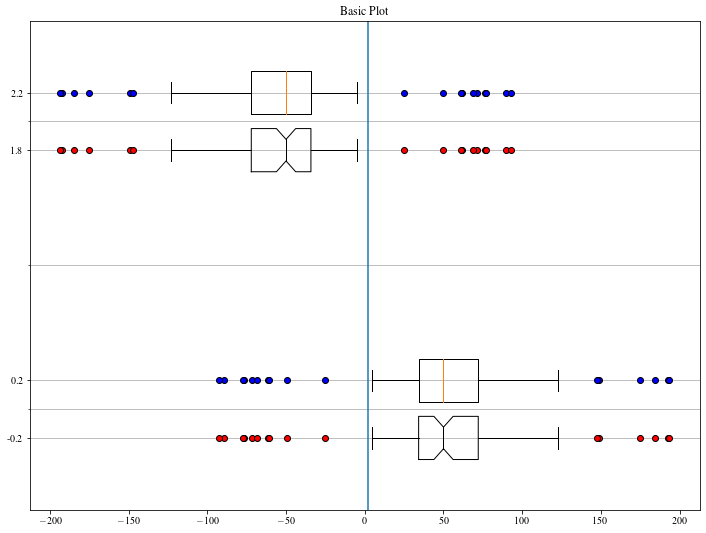

In [89]:
fig1, ax1 = plt.subplots(1, 1, figsize = (12,9))
ax1.set_title('Basic Plot')
red_square = dict(markerfacecolor='r', marker='o')
blue_square = dict(markerfacecolor='b', marker='o')
median = dict(color='k')
ax1.boxplot([data, -data], notch = True, positions = np.array(range(2))*2.0-0.2, vert = False, flierprops = red_square, medianprops = median)
ax1.boxplot([data, -data], positions = np.array(range(2))*2.0+0.2, vert = False, flierprops = blue_square, whis=1.5)
ax1.set_yticks([0,1,2], minor=True)
plt.grid(axis = "y", which = "both")
#plt.grid(axis = "x", which = "major")
plt.axvline(x=2.20589566)

plt.show()